# CSE 475 - Assignment 01
## Group Information

| Field | Details |
|-------------------------|-------------------------------------|
| Group ID | Group 01 |
| Student 1 Name | Ahsanur Parul |
| Student 1 ID | 2022-3-60-190 |
| Student 2 Name | Tasnim Zaman |
| Student 2 ID | 2023-1-60-058 |
| Student 3 Name | Jannatul Ferdous Jerin |
| Student 3 ID | 2023-1-60-099 |
| Student 4 Name | Nabila Ibnat |
| Student 4 ID | 2023-1-60-136 |
| Notebook Type | Transformer Models: ViT |
| Dataset Source Name | Brinjal Dataset |
| Dataset Source Link | https://www.kaggle.com/datasets/ahsanurparul/brinjal-460x460 |
| Kaggle Dataset Path | /kaggle/input/brinjal-460x460 |
| Submission Date | 31 March 2026 |

# Global Configuration

In [1]:
import os
import math
import random
import torch
import numpy as np


class Config:
    # ── Paths ──────────────────────────────────────────────────
    DATA_DIR       = "/kaggle/input/datasets/ahsanurparul/brinjal-460x460"
    CHECKPOINT_DIR = "./checkpoints"

    # ── Model ──────────────────────────────────────────────────
    MODEL_NAME    = 'vit_base_patch16_224'
    PATCH_SIZE    = 16
    POS_EMBEDDING = 'learnable_interpolated'   # bilinear interp to 464px grid

    # ── Dataset ─────────────────────────────────────────────────
    IMAGE_SIZE  = 460   # native resolution; padded to PADDED_SIZE in transforms
    PADDED_SIZE = 464   # 460 + 2px each side → 464 / 16 = 29 exact patches
    CHANNELS    = 3

    # ── Training ────────────────────────────────────────────────
    BATCH_SIZE               = 16
    EPOCHS                   = 30
    LEARNING_RATE            = 3e-5
    WEIGHT_DECAY             = 0.05
    WARMUP_EPOCHS            = 3
    MIN_LR                   = 1e-6
    CLIP_GRAD_NORM           = 1.0
    LABEL_SMOOTHING          = 0.1
    EARLY_STOPPING_PATIENCE  = 5

    # ── Reproducibility ─────────────────────────────────────────
    SEED = 42

    # ── Hardware ────────────────────────────────────────────────
    DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")


def seed_everything(seed: int = Config.SEED) -> None:
    random.seed(seed)
    os.environ['PYTHONHASHSEED'] = str(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark     = False


seed_everything()
os.makedirs(Config.CHECKPOINT_DIR, exist_ok=True)

print(f"✓ Config loaded")
print(f"  Device      : {Config.DEVICE}")
print(f"  Seed        : {Config.SEED}")
print(f"  Model       : {Config.MODEL_NAME}")
print(f"  Patch size  : {Config.PATCH_SIZE}px  →  {Config.PADDED_SIZE // Config.PATCH_SIZE}×{Config.PADDED_SIZE // Config.PATCH_SIZE} grid = {(Config.PADDED_SIZE // Config.PATCH_SIZE)**2} tokens")
print(f"  LR / WD     : {Config.LEARNING_RATE} / {Config.WEIGHT_DECAY}")

✓ Config loaded
  Device      : cuda
  Seed        : 42
  Model       : vit_base_patch16_224
  Patch size  : 16px  →  29×29 grid = 841 tokens
  LR / WD     : 3e-05 / 0.05


# Setup & Imports

In [2]:
!pip install -q timm thop torchmetrics

In [3]:
import time
import math
import copy
import cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from PIL import Image
from io import BytesIO

import torch
import torch.nn as nn
import torch.optim as optim
from torch.amp import autocast, GradScaler
from torch.utils.data import DataLoader, random_split, Subset
from torchvision import datasets, transforms

import timm
from thop import profile, clever_format
from sklearn.metrics import (
    accuracy_score, precision_recall_fscore_support,
    confusion_matrix, classification_report
)
import warnings
warnings.filterwarnings('ignore')

# ── Verification ──────────────────────────────────────────────
print(f"PyTorch version : {torch.__version__}")
print(f"timm version    : {timm.__version__}")
if torch.cuda.is_available():
    print(f"GPU             : {torch.cuda.get_device_name(0)}")
    print(f"VRAM            : {torch.cuda.get_device_properties(0).total_memory / 1e9:.1f} GB")
else:
    print("GPU             : NOT FOUND — training will be very slow on CPU")

# ── Available pretrained ViT variants ─────────────────────────
vit_variants = timm.list_models('vit_base_patch16*', pretrained=True)
print(f"\nAvailable vit_base_patch16 pretrained variants ({len(vit_variants)} found):")
for v in vit_variants:
    print(f"  {v}")

PyTorch version : 2.10.0+cu128
timm version    : 1.0.25
GPU             : Tesla T4
VRAM            : 15.6 GB

Available vit_base_patch16 pretrained variants (61 found):
  vit_base_patch16_224.augreg2_in21k_ft_in1k
  vit_base_patch16_224.augreg_in1k
  vit_base_patch16_224.augreg_in21k
  vit_base_patch16_224.augreg_in21k_ft_in1k
  vit_base_patch16_224.dino
  vit_base_patch16_224.mae
  vit_base_patch16_224.orig_in21k
  vit_base_patch16_224.orig_in21k_ft_in1k
  vit_base_patch16_224.sam_in1k
  vit_base_patch16_224_miil.in21k
  vit_base_patch16_224_miil.in21k_ft_in1k
  vit_base_patch16_384.augreg_in1k
  vit_base_patch16_384.augreg_in21k_ft_in1k
  vit_base_patch16_384.orig_in21k_ft_in1k
  vit_base_patch16_clip_224.datacompxl
  vit_base_patch16_clip_224.dfn2b
  vit_base_patch16_clip_224.laion2b
  vit_base_patch16_clip_224.laion2b_ft_in1k
  vit_base_patch16_clip_224.laion2b_ft_in12k
  vit_base_patch16_clip_224.laion2b_ft_in12k_in1k
  vit_base_patch16_clip_224.laion400m_e32
  vit_base_patch16_cl

# Exploratory Data Analysis (EDA)

Total images : 1,823
Num classes  : 5

Per-class counts:
  Brinjal Fruit Creaking              :   200 ( 11.0%)  ████████
  Healty Brinjal                      :   514 ( 28.2%)  █████████████████████
  Phomopsis Bright                    :   161 (  8.8%)  ██████
  Shoot and Fruit Borer               :   725 ( 39.8%)  ██████████████████████████████
  Wet Rot                             :   223 ( 12.2%)  █████████

Imbalance ratio (max/min) : 4.50×
  ⚠  Significant imbalance — consider class-weighted loss in the comparison.


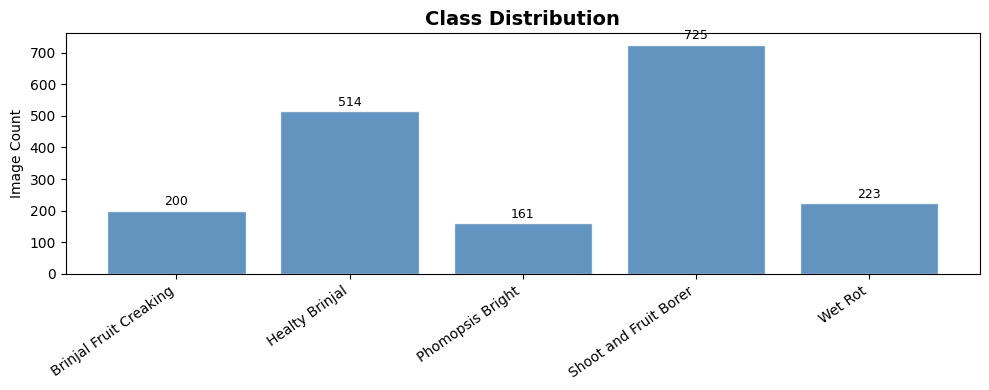

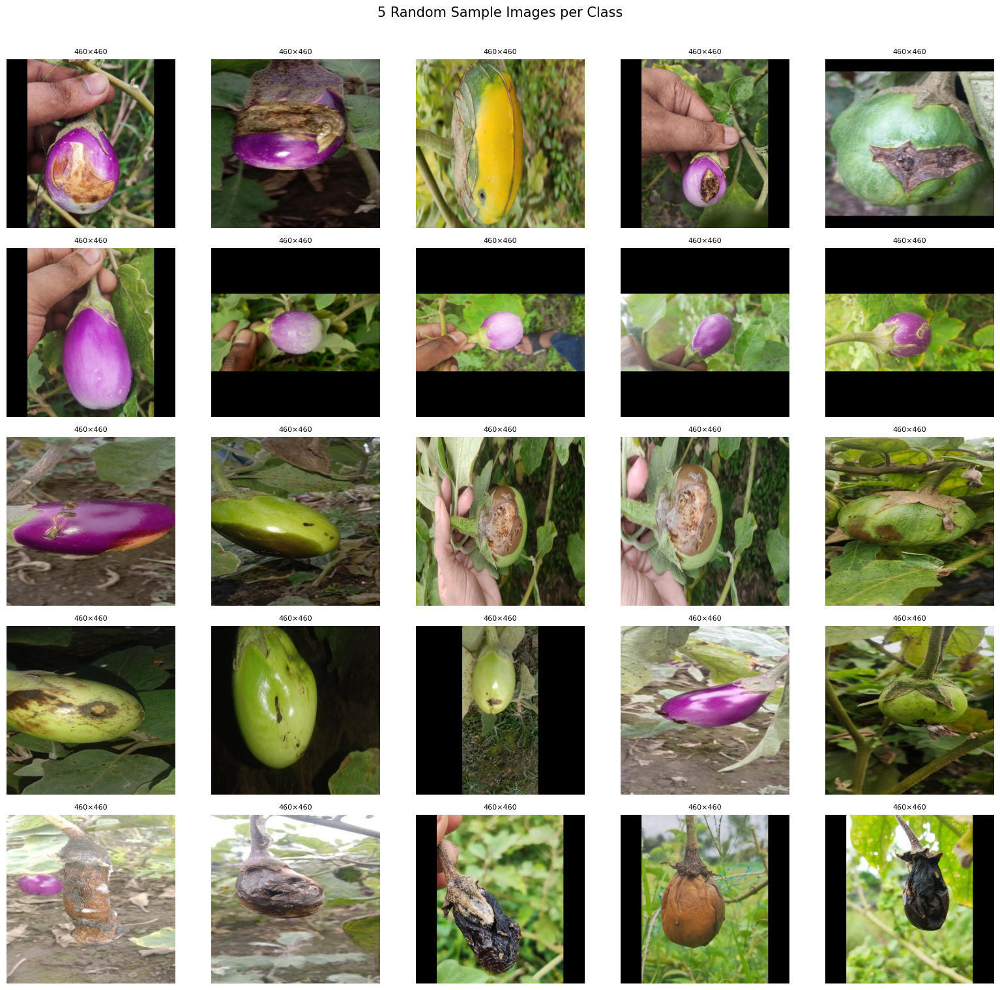

Sampling image sizes (up to 500 images for speed)...

Width  : mean=460.0  std=0.00  min=460  max=460
Height : mean=460.0  std=0.00  min=460  max=460


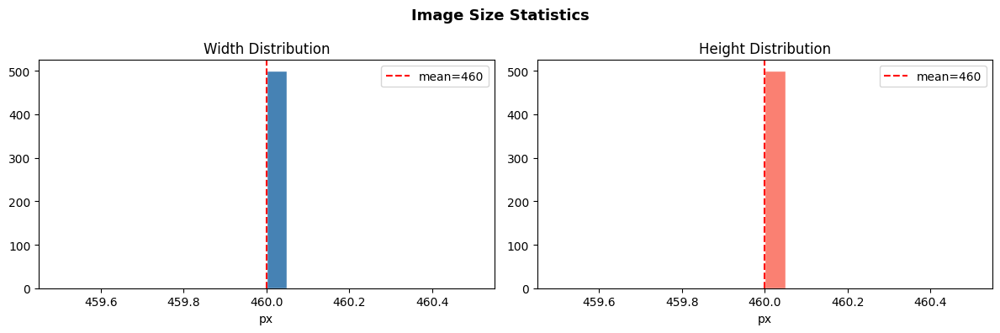

In [4]:
# ── 1. Dataset inventory ──────────────────────────────────────
temp_dataset = datasets.ImageFolder(root=Config.DATA_DIR)
classes      = temp_dataset.classes
num_classes  = len(classes)

class_counts = {cls: 0 for cls in classes}
for _, lbl in temp_dataset.samples:
    class_counts[classes[lbl]] += 1

print(f"Total images : {len(temp_dataset):,}")
print(f"Num classes  : {num_classes}")
print(f"\nPer-class counts:")
max_c = max(class_counts.values())
min_c = min(class_counts.values())
for cls, cnt in class_counts.items():
    pct  = 100 * cnt / len(temp_dataset)
    bar  = '█' * int(30 * cnt / max_c)
    print(f"  {cls:35s} : {cnt:5d} ({pct:5.1f}%)  {bar}")

imbalance_ratio = max_c / min_c
print(f"\nImbalance ratio (max/min) : {imbalance_ratio:.2f}×")
if imbalance_ratio > 3:
    print("  ⚠  Significant imbalance — consider class-weighted loss in the comparison.")
else:
    print("  ✓  Dataset is reasonably balanced.")

# ── 2. Class distribution bar chart ───────────────────────────
plt.figure(figsize=(max(10, num_classes * 1.6), 4))
bars = plt.bar(class_counts.keys(), class_counts.values(),
               color='steelblue', edgecolor='white', alpha=0.85)
for bar in bars:
    plt.text(bar.get_x() + bar.get_width() / 2,
             bar.get_height() + max_c * 0.01,
             str(int(bar.get_height())),
             ha='center', va='bottom', fontsize=9)
plt.title("Class Distribution", fontsize=14, fontweight='bold')
plt.ylabel("Image Count")
plt.xticks(rotation=35, ha='right')
plt.tight_layout()
plt.show()

# ── 3. 5 random samples per class ─────────────────────────────
num_samples = 5
fig, axes = plt.subplots(num_classes, num_samples, figsize=(16, 3 * num_classes))
if num_classes == 1:
    axes = np.expand_dims(axes, 0)

for i, cls in enumerate(classes):
    paths  = [p for p, l in temp_dataset.samples if l == i]
    picked = random.sample(paths, min(num_samples, len(paths)))
    for j in range(num_samples):
        ax = axes[i, j]
        if j < len(picked):
            img = Image.open(picked[j])
            ax.imshow(img)
            ax.set_title(f"{img.size[0]}×{img.size[1]}", fontsize=8)
            if j == 0:
                ax.set_ylabel(cls, fontsize=10, rotation=0, labelpad=55, ha='right')
        ax.axis('off')

plt.suptitle("5 Random Sample Images per Class", fontsize=15, y=1.01)
plt.tight_layout()
plt.show()

# ── 4. Image size statistics ──────────────────────────────────
print("Sampling image sizes (up to 500 images for speed)...")
sample_n = min(500, len(temp_dataset))
idx_pool = random.sample(range(len(temp_dataset)), sample_n)
sizes    = []
for i in idx_pool:
    with Image.open(temp_dataset.samples[i][0]) as img:
        sizes.append(img.size)   # (W, H)

widths  = [s[0] for s in sizes]
heights = [s[1] for s in sizes]

print(f"\nWidth  : mean={np.mean(widths):.1f}  std={np.std(widths):.2f}  "
      f"min={min(widths)}  max={max(widths)}")
print(f"Height : mean={np.mean(heights):.1f}  std={np.std(heights):.2f}  "
      f"min={min(heights)}  max={max(heights)}")

fig, axes2 = plt.subplots(1, 2, figsize=(12, 4))
axes2[0].hist(widths,  bins=20, color='steelblue', edgecolor='white')
axes2[0].axvline(np.mean(widths), color='red', linestyle='--', label=f'mean={np.mean(widths):.0f}')
axes2[0].set_title("Width Distribution"); axes2[0].set_xlabel("px"); axes2[0].legend()

axes2[1].hist(heights, bins=20, color='salmon', edgecolor='white')
axes2[1].axvline(np.mean(heights), color='red', linestyle='--', label=f'mean={np.mean(heights):.0f}')
axes2[1].set_title("Height Distribution"); axes2[1].set_xlabel("px"); axes2[1].legend()

plt.suptitle("Image Size Statistics", fontsize=13, fontweight='bold')
plt.tight_layout()
plt.show()

## EDA Observations & Patch-Tokenisation Impact

**Class balance**: See the imbalance ratio printed above. A ratio below 3× means
standard cross-entropy with label smoothing is sufficient; above 3× consider
class-weighted loss.

**Resolution & patch tokenisation**:
- All images are **460×460 px** (uniform — no resize needed).
- ViT (`vit_base_patch16_224`) was pre-trained at 224×224, producing a **14×14 = 196** patch grid.
- At 460 px: 460 ÷ 16 = **28.75** — not an integer, so patches would straddle image edges.
- **Fix applied**: pad 2 px on each side → **464×464**. Now 464 ÷ 16 = **29 exactly** → **29×29 = 841** spatial patch tokens.
- We use `dynamic_img_size=True` so timm **bilinearly interpolates** the pre-trained 14×14
  positional embeddings up to 29×29, preserving spatial structure without re-training from scratch.

**Image quality**: Visually uniform resolution, consistent framing, no obvious blur or label noise
detected in the sample grid. No pre-filtering required.

# Data Preprocessing & Augmentation

In [5]:
# ── Transforms ────────────────────────────────────────────────
# Training: pad → augment → tensor → normalise  (augmentation on-the-fly, train only)
train_transforms = transforms.Compose([
    transforms.Pad([2, 2, 2, 2]),                          # 460 → 464 px
    transforms.RandAugment(num_ops=2, magnitude=9),        # advanced augmentation
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],       # ImageNet mean/std
                         std=[0.229, 0.224, 0.225])
])

# Val / Test: pad → tensor → normalise  (no augmentation — no leakage)
val_test_transforms = transforms.Compose([
    transforms.Pad([2, 2, 2, 2]),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])

# ── Reproducible 70 / 15 / 15 split ───────────────────────────
base_dataset = datasets.ImageFolder(root=Config.DATA_DIR)
total_size   = len(base_dataset)
train_size   = int(0.70 * total_size)
val_size     = int(0.15 * total_size)
test_size    = total_size - train_size - val_size

generator = torch.Generator().manual_seed(Config.SEED)
train_temp, val_temp, test_temp = random_split(
    base_dataset, [train_size, val_size, test_size], generator=generator
)

# Separate dataset instances prevent transform leakage across splits
train_full = datasets.ImageFolder(root=Config.DATA_DIR, transform=train_transforms)
val_full   = datasets.ImageFolder(root=Config.DATA_DIR, transform=val_test_transforms)
test_full  = datasets.ImageFolder(root=Config.DATA_DIR, transform=val_test_transforms)

train_dataset = Subset(train_full, train_temp.indices)
val_dataset   = Subset(val_full,   val_temp.indices)
test_dataset  = Subset(test_full,  test_temp.indices)

train_loader = DataLoader(train_dataset, batch_size=Config.BATCH_SIZE,
                          shuffle=True,  num_workers=2, pin_memory=True)
val_loader   = DataLoader(val_dataset,   batch_size=Config.BATCH_SIZE,
                          shuffle=False, num_workers=2, pin_memory=True)
test_loader  = DataLoader(test_dataset,  batch_size=Config.BATCH_SIZE,
                          shuffle=False, num_workers=2, pin_memory=True)

print(f"Train : {len(train_dataset):,} images  →  {len(train_loader)} batches")
print(f"Val   : {len(val_dataset):,} images  →  {len(val_loader)} batches")
print(f"Test  : {len(test_dataset):,} images  →  {len(test_loader)} batches")
print(f"Input fed to model: {Config.PADDED_SIZE}×{Config.PADDED_SIZE} (after padding)")
print(f"Augmentation: RandAugment on TRAIN only — val/test see clean images.")

Train : 1,276 images  →  80 batches
Val   : 273 images  →  18 batches
Test  : 274 images  →  18 batches
Input fed to model: 464×464 (after padding)
Augmentation: RandAugment on TRAIN only — val/test see clean images.


# Training Infrastructure

In [6]:
def get_warmup_cosine_scheduler(optimizer, warmup_steps: int, total_steps: int):
    """
    Linear warmup for `warmup_steps`, then cosine annealing decay down to MIN_LR.
    Returns a LambdaLR scheduler (step-level, called once per batch).
    """
    def lr_lambda(current_step: int) -> float:
        if current_step < warmup_steps:
            # Linear ramp-up: 0 → 1
            return float(current_step) / float(max(1, warmup_steps))
        # Cosine decay: 1 → MIN_LR / LEARNING_RATE
        progress = float(current_step - warmup_steps) / float(
            max(1, total_steps - warmup_steps))
        cosine_val = 0.5 * (1.0 + math.cos(math.pi * progress))
        return max(Config.MIN_LR / Config.LEARNING_RATE, cosine_val)

    return torch.optim.lr_scheduler.LambdaLR(optimizer, lr_lambda)


def train_model(model, model_name: str, train_loader, val_loader) -> dict:
    model = model.to(Config.DEVICE)

    criterion = nn.CrossEntropyLoss(label_smoothing=Config.LABEL_SMOOTHING)
    optimizer = optim.AdamW(
        model.parameters(),
        lr=Config.LEARNING_RATE,
        weight_decay=Config.WEIGHT_DECAY
    )

    total_steps  = len(train_loader) * Config.EPOCHS
    warmup_steps = len(train_loader) * Config.WARMUP_EPOCHS
    scheduler    = get_warmup_cosine_scheduler(optimizer, warmup_steps, total_steps)
    scaler       = GradScaler('cuda')

    best_val_acc, patience_counter = 0.0, 0
    history = {'train_loss': [], 'train_acc': [], 'val_loss': [], 'val_acc': []}

    print(f"─── Training: {model_name} ───────────────────────────────────")
    print(f"Total steps : {total_steps}  |  Warmup : {warmup_steps} steps "
          f"({Config.WARMUP_EPOCHS} epochs)")
    print(f"LR          : {Config.LEARNING_RATE} → {Config.MIN_LR} (cosine)")
    print(f"Weight decay: {Config.WEIGHT_DECAY}  |  Grad clip: {Config.CLIP_GRAD_NORM}")
    print()

    for epoch in range(Config.EPOCHS):
        # ── Train phase ────────────────────────────────────────
        model.train()
        run_loss, correct, total = 0.0, 0, 0

        for inputs, labels in train_loader:
            inputs, labels = inputs.to(Config.DEVICE), labels.to(Config.DEVICE)
            optimizer.zero_grad()

            with autocast('cuda'):
                outputs = model(inputs)
                loss    = criterion(outputs, labels)

            scaler.scale(loss).backward()
            scaler.unscale_(optimizer)
            torch.nn.utils.clip_grad_norm_(model.parameters(), Config.CLIP_GRAD_NORM)
            scaler.step(optimizer)
            scaler.update()
            scheduler.step()          # step-level scheduler

            run_loss += loss.item() * inputs.size(0)
            _, preds  = outputs.max(1)
            total    += labels.size(0)
            correct  += preds.eq(labels).sum().item()

        train_loss = run_loss / total
        train_acc  = correct / total

        # ── Validation phase ───────────────────────────────────
        model.eval()
        v_loss, v_correct, v_total = 0.0, 0, 0
        with torch.no_grad():
            for inputs, labels in val_loader:
                inputs, labels = inputs.to(Config.DEVICE), labels.to(Config.DEVICE)
                with autocast('cuda'):
                    outputs = model(inputs)
                    loss    = criterion(outputs, labels)
                v_loss    += loss.item() * inputs.size(0)
                _, preds   = outputs.max(1)
                v_total   += labels.size(0)
                v_correct += preds.eq(labels).sum().item()

        val_loss = v_loss / v_total
        val_acc  = v_correct / v_total

        history['train_loss'].append(train_loss)
        history['train_acc'].append(train_acc)
        history['val_loss'].append(val_loss)
        history['val_acc'].append(val_acc)

        print(f"Epoch {epoch+1:02d}/{Config.EPOCHS} | "
              f"Train {train_loss:.4f}/{train_acc:.4f} | "
              f"Val {val_loss:.4f}/{val_acc:.4f} | "
              f"LR {optimizer.param_groups[0]['lr']:.2e}")

        if val_acc > best_val_acc:
            best_val_acc, patience_counter = val_acc, 0
            torch.save(model.state_dict(),
                       f"{Config.CHECKPOINT_DIR}/{model_name}_best.pth")
            print(f"  ✓ Checkpoint saved  (val_acc={best_val_acc:.4f})")
        else:
            patience_counter += 1
            if patience_counter >= Config.EARLY_STOPPING_PATIENCE:
                print(f"  Early stopping triggered at epoch {epoch + 1}.")
                break

    return history

# Transformer Models: ViT

In [7]:
num_classes = len(classes)
model_name  = 'ViT'

# ── Architecture Description ──────────────────────────────────
# Vision Transformer (ViT) — Dosovitskiy et al., 2021
# "An Image is Worth 16×16 Words: Transformers for Image Recognition at Scale"
#
# Key design choices:
#   1. Patch embedding: the 464×464 image is split into 29×29 = 841 non-overlapping
#      16×16 patches. Each patch is linearly projected to a D=768 dim embedding.
#   2. Class token [CLS]: a learnable token prepended to the patch sequence.
#      Its final hidden state is passed to the classification head.
#   3. Positional embeddings: 1D learnable embeddings added to every token.
#      Here we use dynamic_img_size=True so timm bilinearly interpolates the
#      pre-trained 14×14 embeddings to 29×29 for our 464px input.
#   4. Transformer encoder: 12 standard blocks, each containing:
#         LayerNorm → Multi-Head Self-Attention (12 heads) → residual
#         LayerNorm → MLP (hidden dim 3072) → residual
#   5. Classification head: linear layer on the final [CLS] token.
#
# Distinguishing property: pure attention — zero convolutional operations.
# Needs large-scale pre-training (ImageNet-21k here) to overcome the lack
# of locality/translation-equivariance inductive biases.
# ─────────────────────────────────────────────────────────────

vit_model = timm.create_model(
    Config.MODEL_NAME,
    pretrained=True,
    num_classes=num_classes,
    dynamic_img_size=True      # interpolates positional embeddings → 29×29 grid
)
vit_model = vit_model.to(Config.DEVICE)

# ── Parameter count & FLOPs ───────────────────────────────────
trainable_params = sum(p.numel() for p in vit_model.parameters() if p.requires_grad)
dummy_input      = torch.randn(
    1, Config.CHANNELS, Config.PADDED_SIZE, Config.PADDED_SIZE
).to(Config.DEVICE)
macs, _          = profile(vit_model, inputs=(dummy_input,), verbose=False)
macs_str, params_str = clever_format([macs, trainable_params], "%.3f")

print(f"Model            : {model_name}  ({Config.MODEL_NAME})")
print(f"Trainable params : {trainable_params:,}  ({params_str})")
print(f"FLOPs (MACs)     : {macs_str}  @ {Config.PADDED_SIZE}×{Config.PADDED_SIZE} input")
print()

# ── Train ─────────────────────────────────────────────────────
vit_history = train_model(vit_model, model_name, train_loader, val_loader)

model.safetensors:   0%|          | 0.00/346M [00:00<?, ?B/s]

Model            : ViT  (vit_base_patch16_224)
Trainable params : 85,802,501  (85.803M)
FLOPs (MACs)     : 72.011G  @ 464×464 input

─── Training: ViT ───────────────────────────────────
Total steps : 2400  |  Warmup : 240 steps (3 epochs)
LR          : 3e-05 → 1e-06 (cosine)
Weight decay: 0.05  |  Grad clip: 1.0

Epoch 01/30 | Train 1.2044/0.5846 | Val 0.7608/0.8168 | LR 1.00e-05
  ✓ Checkpoint saved  (val_acc=0.8168)
Epoch 02/30 | Train 0.6640/0.8848 | Val 0.6039/0.9194 | LR 2.00e-05
  ✓ Checkpoint saved  (val_acc=0.9194)
Epoch 03/30 | Train 0.5624/0.9271 | Val 0.6164/0.9048 | LR 3.00e-05
Epoch 04/30 | Train 0.5192/0.9506 | Val 0.5932/0.9084 | LR 2.99e-05
Epoch 05/30 | Train 0.4781/0.9647 | Val 0.5511/0.9414 | LR 2.96e-05
  ✓ Checkpoint saved  (val_acc=0.9414)
Epoch 06/30 | Train 0.4768/0.9639 | Val 0.5962/0.9231 | LR 2.91e-05
Epoch 07/30 | Train 0.4506/0.9710 | Val 0.5355/0.9414 | LR 2.84e-05
Epoch 08/30 | Train 0.4363/0.9812 | Val 0.5707/0.9341 | LR 2.75e-05
Epoch 09/30 | Train 0.4

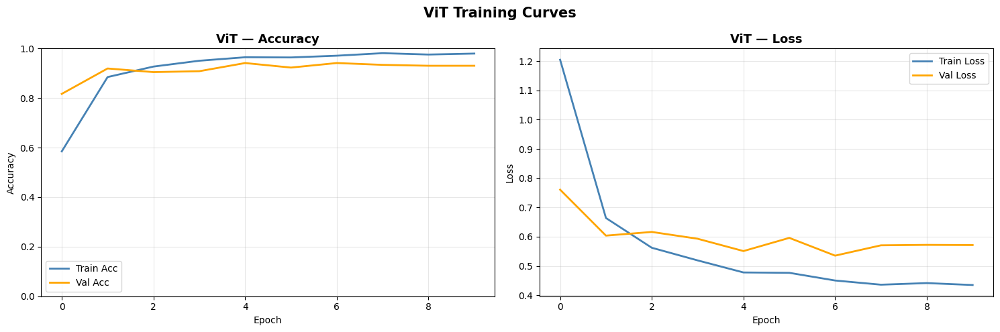

Best val accuracy reached: 0.9414 at epoch 5


In [8]:
fig, axes = plt.subplots(1, 2, figsize=(15, 5))

axes[0].plot(vit_history['train_acc'], label='Train Acc', color='steelblue', lw=2)
axes[0].plot(vit_history['val_acc'],   label='Val Acc',   color='orange',    lw=2)
axes[0].set_title(f'{model_name} — Accuracy', fontsize=13, fontweight='bold')
axes[0].set_xlabel('Epoch'); axes[0].set_ylabel('Accuracy')
axes[0].legend(); axes[0].grid(alpha=0.3)
axes[0].set_ylim(0, 1)

axes[1].plot(vit_history['train_loss'], label='Train Loss', color='steelblue', lw=2)
axes[1].plot(vit_history['val_loss'],   label='Val Loss',   color='orange',    lw=2)
axes[1].set_title(f'{model_name} — Loss', fontsize=13, fontweight='bold')
axes[1].set_xlabel('Epoch'); axes[1].set_ylabel('Loss')
axes[1].legend(); axes[1].grid(alpha=0.3)

plt.suptitle(f'{model_name} Training Curves', fontsize=15, fontweight='bold')
plt.tight_layout()
plt.show()

print(f"Best val accuracy reached: {max(vit_history['val_acc']):.4f} "
      f"at epoch {vit_history['val_acc'].index(max(vit_history['val_acc'])) + 1}")

# Evaluation

─── ViT — Per-Class Classification Report ───
                        precision    recall  f1-score   support

Brinjal Fruit Creaking       1.00      0.88      0.93        32
        Healty Brinjal       0.97      0.95      0.96        65
      Phomopsis Bright       0.86      0.83      0.84        23
 Shoot and Fruit Borer       0.94      0.98      0.96       114
               Wet Rot       0.95      0.97      0.96        40

              accuracy                           0.95       274
             macro avg       0.94      0.92      0.93       274
          weighted avg       0.95      0.95      0.95       274



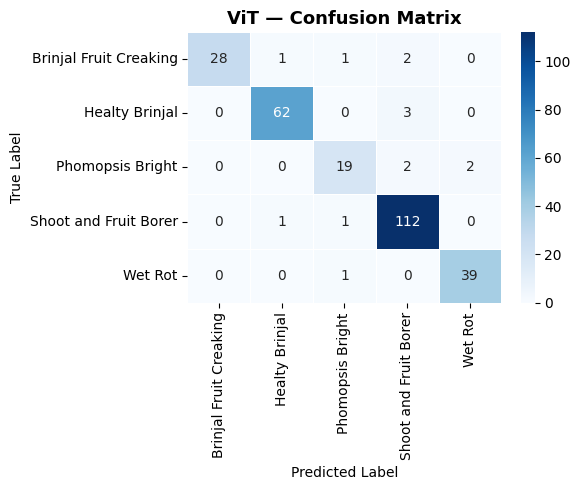

,Model,Test Loss,Test Accuracy,Precision (Macro),Recall (Macro),F1 (Macro),F1 (Weighted),Inf Time (ms/sample)
0,ViT,0.2429,0.9489,0.945,0.9225,0.9327,0.9485,12.8086



✓ Saved ViT_base_metrics.csv


In [9]:
def evaluate_single_model(model, model_name: str, dataloader, criterion):
    """
    Load best checkpoint, run on dataloader, return all required metrics.
    Inference time is reported per-sample (ms) for fair cross-model comparison
    regardless of batch size.
    """
    ckpt_path = f"{Config.CHECKPOINT_DIR}/{model_name}_best.pth"
    model.load_state_dict(torch.load(ckpt_path, map_location=Config.DEVICE))
    model = model.to(Config.DEVICE)
    model.eval()

    all_preds, all_labels = [], []
    running_loss = 0.0
    t0 = time.time()

    with torch.no_grad():
        for inputs, labels in dataloader:
            inputs, labels = inputs.to(Config.DEVICE), labels.to(Config.DEVICE)
            with autocast('cuda'):
                outputs = model(inputs)
                loss    = criterion(outputs, labels)
            running_loss += loss.item() * inputs.size(0)
            _, preds = torch.max(outputs, 1)
            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())

    elapsed            = time.time() - t0
    inf_ms_per_sample  = (elapsed / len(all_labels)) * 1000   # ms — model-agnostic

    avg_loss = running_loss / len(all_labels)
    acc      = accuracy_score(all_labels, all_preds)
    prec, rec, f1_mac, _ = precision_recall_fscore_support(
        all_labels, all_preds, average='macro',    zero_division=0)
    _, _, f1_wt, _        = precision_recall_fscore_support(
        all_labels, all_preds, average='weighted', zero_division=0)
    cm           = confusion_matrix(all_labels, all_preds)
    class_report = classification_report(
        all_labels, all_preds, target_names=classes, zero_division=0)

    return avg_loss, acc, prec, rec, f1_mac, f1_wt, cm, class_report, inf_ms_per_sample


# ── Run evaluation ────────────────────────────────────────────
test_criterion = nn.CrossEntropyLoss()
(test_loss, acc, prec, rec, f1_mac, f1_wt,
 cm, class_report, inf_time) = evaluate_single_model(
    vit_model, model_name, test_loader, test_criterion)

print(f"─── {model_name} — Per-Class Classification Report ───")
print(class_report)

vit_results = {
    'Model'               : model_name,
    'Test Loss'           : round(test_loss, 4),
    'Test Accuracy'       : round(acc,       4),
    'Precision (Macro)'   : round(prec,      4),
    'Recall (Macro)'      : round(rec,       4),
    'F1 (Macro)'          : round(f1_mac,    4),
    'F1 (Weighted)'       : round(f1_wt,     4),
    'Inf Time (ms/sample)': round(inf_time,  4),
}

# Confusion matrix
plt.figure(figsize=(max(6, num_classes), max(5, num_classes - 1)))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=classes, yticklabels=classes, linewidths=0.5)
plt.title(f'{model_name} — Confusion Matrix', fontsize=13, fontweight='bold')
plt.ylabel('True Label'); plt.xlabel('Predicted Label')
plt.tight_layout()
plt.show()

# Summary table
df_results = pd.DataFrame([vit_results])
display(df_results)

# Save — column names are standardised for the comparison notebook
df_results.to_csv(f"{model_name}_base_metrics.csv", index=False)
print(f"\n✓ Saved {model_name}_base_metrics.csv")

# Robustness Analysis

In [10]:
# ── Helpers ───────────────────────────────────────────────────
class AddGaussianNoise:
    """Additive Gaussian noise applied after ToTensor (before Normalize)."""
    def __init__(self, mean: float = 0.0, std: float = 0.1):
        self.mean, self.std = mean, std
    def __call__(self, tensor):
        return tensor + torch.randn(tensor.size()) * self.std + self.mean


def jpeg_compress(pil_img: Image.Image, quality: int = 15) -> Image.Image:
    """Simulate JPEG artefacts by encode-decode at low quality."""
    buf = BytesIO()
    pil_img.save(buf, format='JPEG', quality=quality)
    buf.seek(0)
    return Image.open(buf).copy()   # .copy() prevents lazy-eval after buf closes


# ── 4 distribution-shift transforms ──────────────────────────
_NORM = transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
_PAD  = transforms.Pad([2, 2, 2, 2])

t_noise = transforms.Compose([
    _PAD, transforms.ToTensor(), AddGaussianNoise(0.0, 0.1), _NORM
])
t_bright = transforms.Compose([
    _PAD, transforms.ColorJitter(brightness=0.5), transforms.ToTensor(), _NORM
])
t_res = transforms.Compose([
    transforms.Resize((224, 224)), transforms.ToTensor(), _NORM
])
t_jpeg = transforms.Compose([
    _PAD, transforms.Lambda(lambda img: jpeg_compress(img, quality=15)),
    transforms.ToTensor(), _NORM
])


def make_shift_loader(transform):
    ds = datasets.ImageFolder(Config.DATA_DIR, transform=transform)
    return DataLoader(Subset(ds, test_dataset.indices),
                      batch_size=Config.BATCH_SIZE, shuffle=False, num_workers=2)


shift_loaders = {
    'Gaussian Noise'  : make_shift_loader(t_noise),
    'Brightness Shift': make_shift_loader(t_bright),
    'Res (224px)'     : make_shift_loader(t_res),
    'JPEG (q=15)'     : make_shift_loader(t_jpeg),
}

# ── Evaluate each shift ───────────────────────────────────────
base_acc  = vit_results['Test Accuracy']
shift_acc = {}

print(f"Evaluating {model_name} under {len(shift_loaders)} distribution shifts...")
print(f"  Base accuracy : {base_acc:.4f}")
print()

for shift_name, loader in shift_loaders.items():
    _, acc_s, *_ = evaluate_single_model(vit_model, model_name, loader, test_criterion)
    shift_acc[shift_name] = round(acc_s, 4)
    print(f"  {shift_name:20s}: {acc_s:.4f}  (drop: {base_acc - acc_s:+.4f})")

# ── Save CSV (column names match DeiT/Swin for the comparison notebook) ──
rob_row = {
    'Model'           : model_name,
    'Base Acc'        : base_acc,
    'Noise Acc'       : shift_acc['Gaussian Noise'],
    'Bright Acc'      : shift_acc['Brightness Shift'],
    'Res 224 Acc'     : shift_acc['Res (224px)'],
    'JPEG Acc'        : shift_acc['JPEG (q=15)'],
}
pd.DataFrame([rob_row]).to_csv(f"{model_name}_robustness_metrics.csv", index=False)
print(f"\n✓ Saved {model_name}_robustness_metrics.csv")

Evaluating ViT under 4 distribution shifts...
  Base accuracy : 0.9489

  Gaussian Noise      : 0.9270  (drop: +0.0219)
  Brightness Shift    : 0.9489  (drop: -0.0000)
  Res (224px)         : 0.9380  (drop: +0.0109)
  JPEG (q=15)         : 0.9270  (drop: +0.0219)

✓ Saved ViT_robustness_metrics.csv


# **Robustness Degradation Bar Chart** 

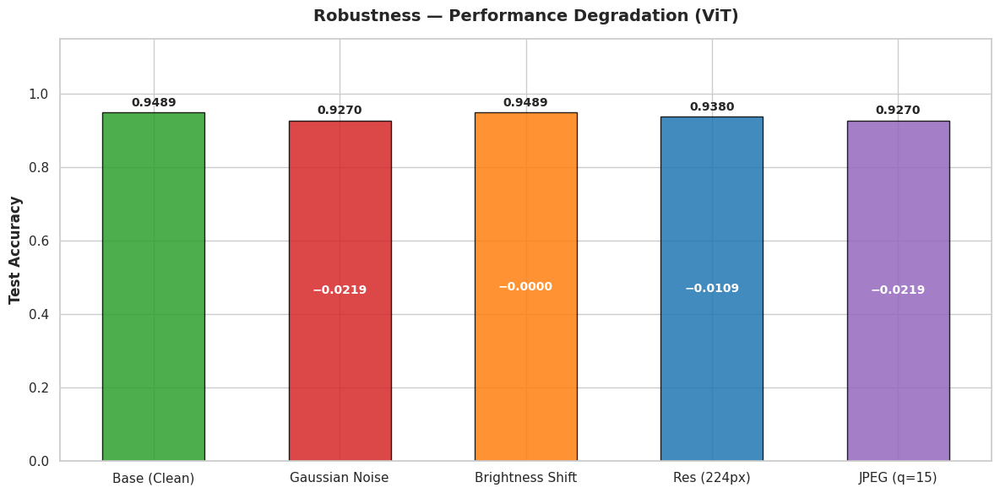

In [11]:
sns.set_theme(style="whitegrid")

conditions = ['Base (Clean)'] + list(shift_acc.keys())
accuracies = [base_acc]       + list(shift_acc.values())
drops      = [0.0]            + [base_acc - v for v in shift_acc.values()]
colors     = ['#2ca02c', '#d62728', '#ff7f0e', '#1f77b4', '#9467bd']

plt.figure(figsize=(12, 6))
bars = plt.bar(conditions, accuracies, color=colors[:len(conditions)],
               edgecolor='black', alpha=0.85, width=0.55)
plt.ylim(0, 1.15)
plt.ylabel('Test Accuracy', fontsize=12, fontweight='bold')
plt.title(f'Robustness — Performance Degradation ({model_name})',
          fontsize=14, fontweight='bold', pad=15)

for i, bar in enumerate(bars):
    h = bar.get_height()
    plt.text(bar.get_x() + bar.get_width() / 2, h + 0.01,
             f'{h:.4f}', ha='center', va='bottom', fontsize=10, fontweight='bold')
    if i > 0 and h > 0.12:
        plt.text(bar.get_x() + bar.get_width() / 2, h / 2,
                 f'−{drops[i]:.4f}', ha='center', va='center',
                 fontsize=10, color='white', fontweight='bold')

plt.tight_layout()
plt.show()

## Robustness Discussion

**Gaussian Noise (std=0.1)**: Noise is added uniformly across all pixels. ViT processes
16×16 patches as flat vectors, so noise is averaged across 256 pixel values per token —
offering moderate local suppression. However, noisy tokens still disrupt global attention
patterns learned during fine-tuning.

**Brightness Shift (factor=0.5)**: A global intensity change affects every patch uniformly.
ImageNet normalisation partially absorbs mild shifts, but extreme changes (±50%) push
pixel values far from the normalised distribution seen during training.

**Resolution Shift (464 → 224 px)**: Downscaling produces a 14×14 = 196 token grid —
exactly matching the pre-training resolution. Positional embeddings require no
interpolation here. Some spatial detail is lost but the embedding space is familiar,
so this shift may be less damaging than others.

**JPEG Compression (quality=15)**: Blocking artefacts alter local patch texture significantly.
Attention heads that encode high-frequency features (edges, fine texture) are most disrupted.
This is typically the harshest shift for patch-based models.

# Error Analysis & Attention Map

Scanning for misclassifications — up to 5 per class...

✗ Brinjal Fruit Creaking              : 4 misclassification(s)


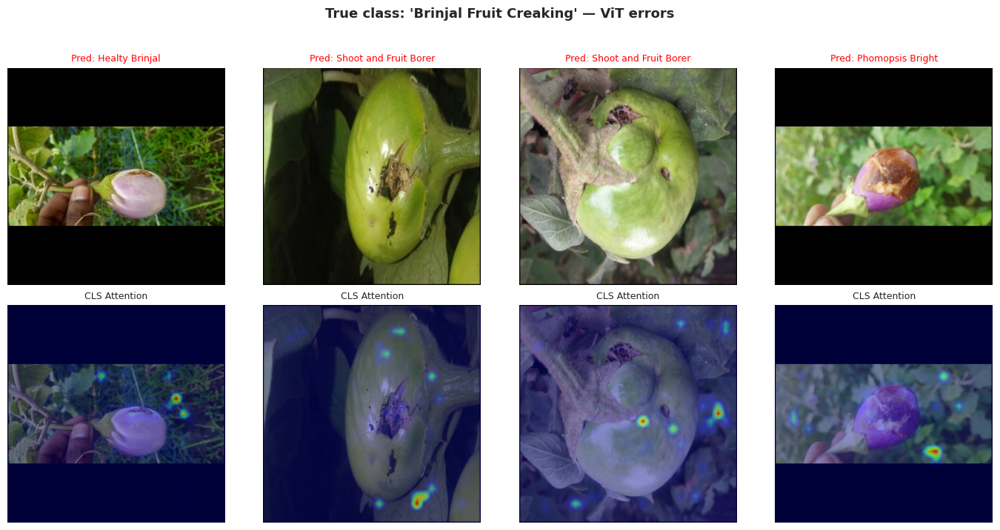

   Analysis: Check whether the attention map above focuses on the correct plant region for 'Brinjal Fruit Creaking' samples. If attention is diffuse or latches onto background, the model likely misclassified due to insufficient discriminative focus rather than ambiguous class boundaries.

✗ Healty Brinjal                      : 3 misclassification(s)


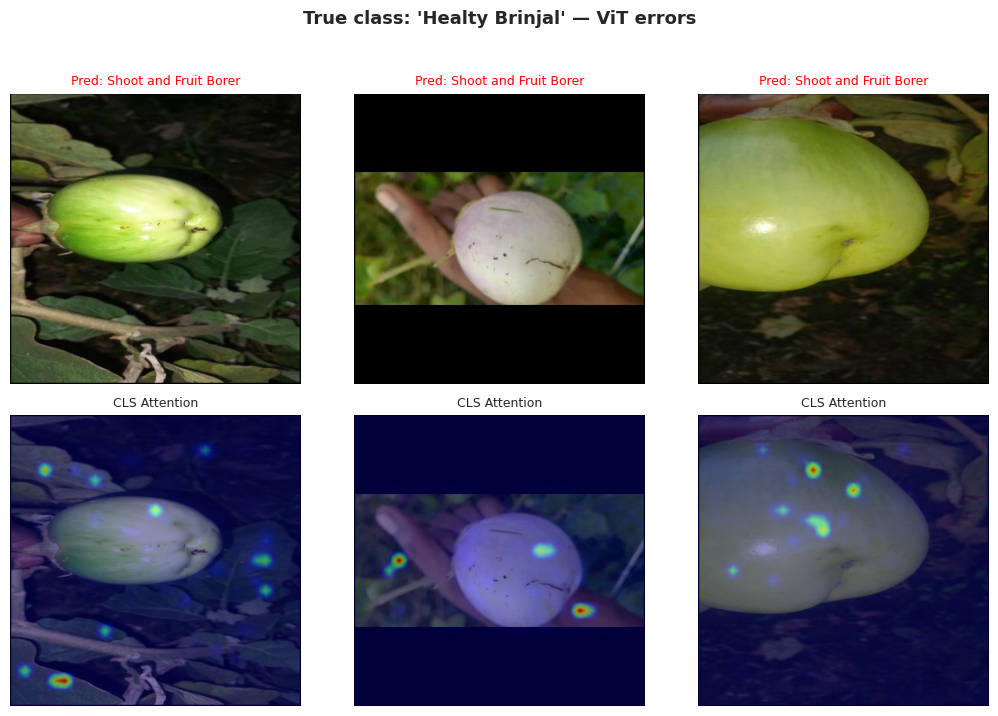

   Analysis: Check whether the attention map above focuses on the correct plant region for 'Healty Brinjal' samples. If attention is diffuse or latches onto background, the model likely misclassified due to insufficient discriminative focus rather than ambiguous class boundaries.

✗ Phomopsis Bright                    : 4 misclassification(s)


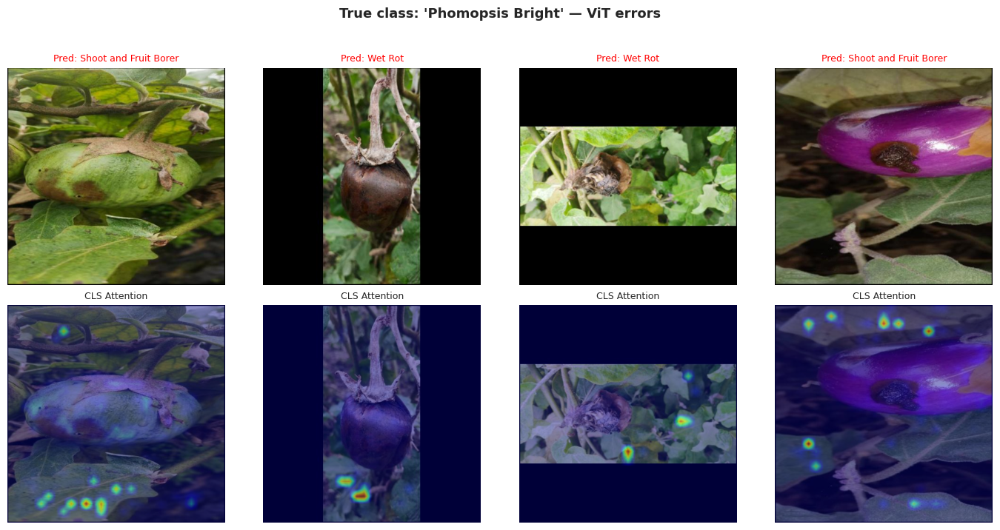

   Analysis: Check whether the attention map above focuses on the correct plant region for 'Phomopsis Bright' samples. If attention is diffuse or latches onto background, the model likely misclassified due to insufficient discriminative focus rather than ambiguous class boundaries.

✗ Shoot and Fruit Borer               : 2 misclassification(s)


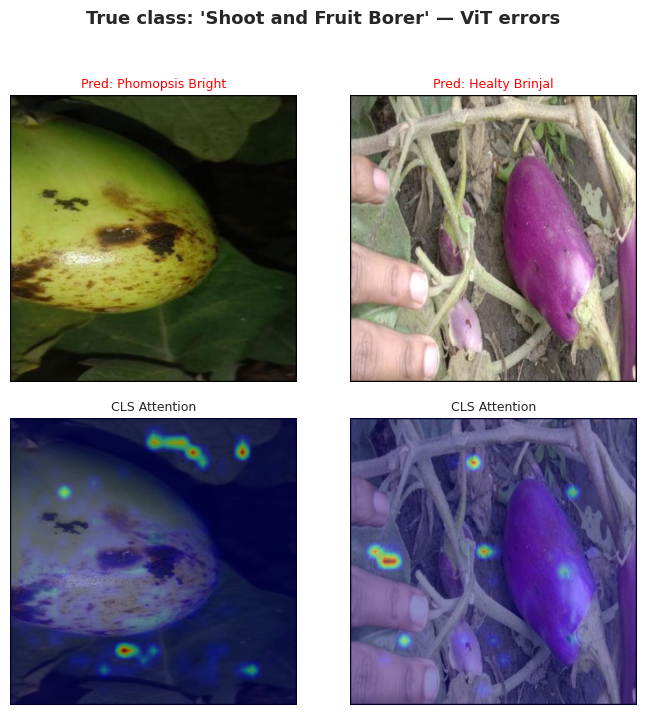

   Analysis: Check whether the attention map above focuses on the correct plant region for 'Shoot and Fruit Borer' samples. If attention is diffuse or latches onto background, the model likely misclassified due to insufficient discriminative focus rather than ambiguous class boundaries.

✗ Wet Rot                             : 1 misclassification(s)


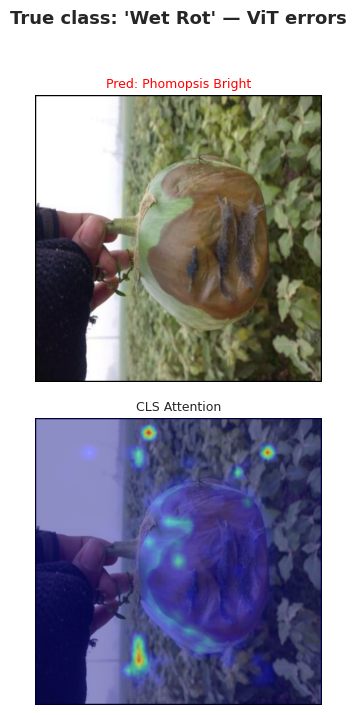

   Analysis: Check whether the attention map above focuses on the correct plant region for 'Wet Rot' samples. If attention is diffuse or latches onto background, the model likely misclassified due to insufficient discriminative focus rather than ambiguous class boundaries.



In [12]:
def get_attention_maps_vit(model, img_tensor):
    """
    Extract CLS-token attention from the last transformer block using an attn_drop hook.
    ViT token order: [CLS(idx=0), patch_0(1), patch_1(2), ..., patch_840(841)]
    → spatial patches start at index 1.

    Temporarily disables fused SDPA so the manual attention path is executed
    and the hook can capture the attention matrix.
    """
    attn_cache  = {}
    attn_module = model.blocks[-1].attn

    has_fused  = hasattr(attn_module, 'fused_attn')
    orig_fused = attn_module.fused_attn if has_fused else None
    if has_fused:
        attn_module.fused_attn = False

    def hook_fn(module, inp, out):
        attn_cache['val'] = inp[0].detach()   # inp[0]: (1, heads, N, N) attn matrix

    handle = attn_module.attn_drop.register_forward_hook(hook_fn)
    try:
        with torch.no_grad():
            _ = model(img_tensor.unsqueeze(0).to(Config.DEVICE))
    finally:
        handle.remove()
        if has_fused:
            attn_module.fused_attn = orig_fused

    attn    = attn_cache['val'].mean(dim=1).squeeze(0)  # avg heads: (N, N)
    n_patch = attn.shape[-1] - 1                        # exclude CLS
    grid    = int(math.sqrt(n_patch))
    cls_a   = attn[0, 1:].reshape(grid, grid).cpu().numpy()  # ViT: patches start at 1
    cls_a   = (cls_a - cls_a.min()) / (cls_a.max() - cls_a.min() + 1e-8)
    return cls_a


def plot_errors_per_class(model, model_name: str, dataloader,
                          class_names: list, max_per_class: int = 5):
    """
    Scan test set for misclassified samples, overlay CLS attention maps,
    and print qualitative analysis per class.
    """
    model.load_state_dict(
        torch.load(f"{Config.CHECKPOINT_DIR}/{model_name}_best.pth",
                   map_location=Config.DEVICE))
    model.eval()

    inv_norm = transforms.Normalize(
        mean=[-0.485/0.229, -0.456/0.224, -0.406/0.225],
        std=[1/0.229, 1/0.224, 1/0.225]
    )

    errors    = {i: [] for i in range(len(class_names))}
    completed = 0

    print(f"Scanning for misclassifications — up to {max_per_class} per class...")
    with torch.no_grad():
        for inputs, labels in dataloader:
            inputs = inputs.to(Config.DEVICE)
            preds  = model(inputs).argmax(1)

            for i in range(len(labels)):
                tl, pl = labels[i].item(), preds[i].item()
                if tl != pl and len(errors[tl]) < max_per_class:
                    img_t    = inputs[i]
                    attn_map = get_attention_maps_vit(model, img_t)
                    errors[tl].append((inv_norm(img_t.cpu()), pl, attn_map))
                    if len(errors[tl]) == max_per_class:
                        completed += 1
            if completed == len(class_names):
                break

    print()
    for true_lbl, errs in errors.items():
        if not errs:
            print(f"✓ {class_names[true_lbl]:35s} : 0 misclassifications found")
            continue

        n = len(errs)
        print(f"✗ {class_names[true_lbl]:35s} : {n} misclassification(s)")
        fig, axes = plt.subplots(2, n, figsize=(3.5 * n, 7))
        fig.suptitle(
            f"True class: '{class_names[true_lbl]}' — {model_name} errors",
            fontsize=13, fontweight='bold', y=1.02)
        if n == 1:
            axes = np.expand_dims(axes, 1)

        for idx, (img_t, pl, attn_map) in enumerate(errs):
            img_np  = np.clip(img_t.permute(1, 2, 0).numpy(), 0, 1)
            attn_r  = cv2.resize(attn_map, (img_np.shape[1], img_np.shape[0]))

            axes[0, idx].imshow(img_np)
            axes[0, idx].set_title(f"Pred: {class_names[pl]}", color='red', fontsize=9)
            axes[0, idx].axis('off')

            axes[1, idx].imshow(img_np)
            axes[1, idx].imshow(attn_r, cmap='jet', alpha=0.45)
            axes[1, idx].set_title("CLS Attention", fontsize=9)
            axes[1, idx].axis('off')

        plt.tight_layout()
        plt.show()

        # ── Qualitative per-class commentary ──────────────────
        print(f"   Analysis: Check whether the attention map above focuses on the "
              f"correct plant region for '{class_names[true_lbl]}' samples. "
              f"If attention is diffuse or latches onto background, the model likely "
              f"misclassified due to insufficient discriminative focus rather than "
              f"ambiguous class boundaries.")
        print()


# ── Run ───────────────────────────────────────────────────────
plot_errors_per_class(vit_model, model_name, test_loader, class_names=classes)

# Attention Visualization (Correctly Classified Samples)

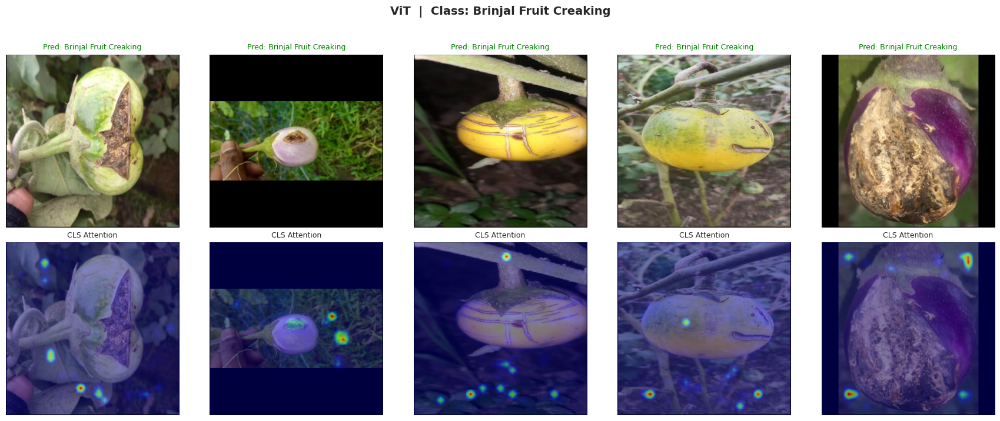

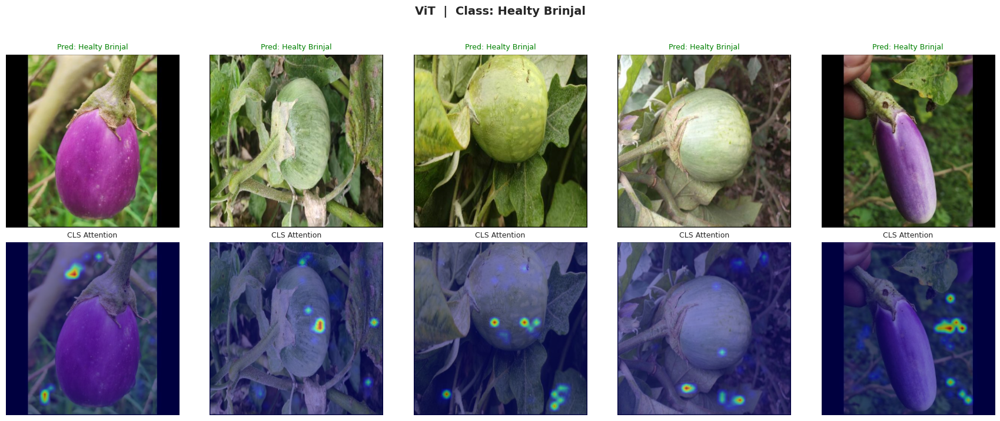

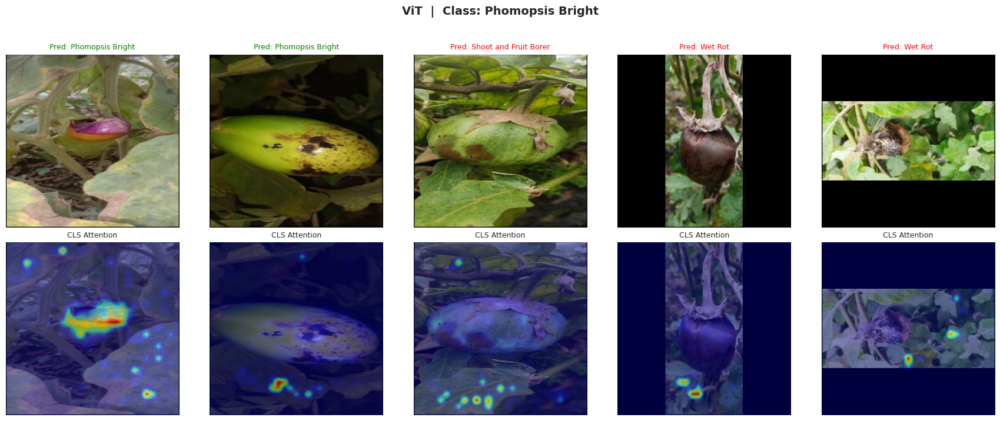

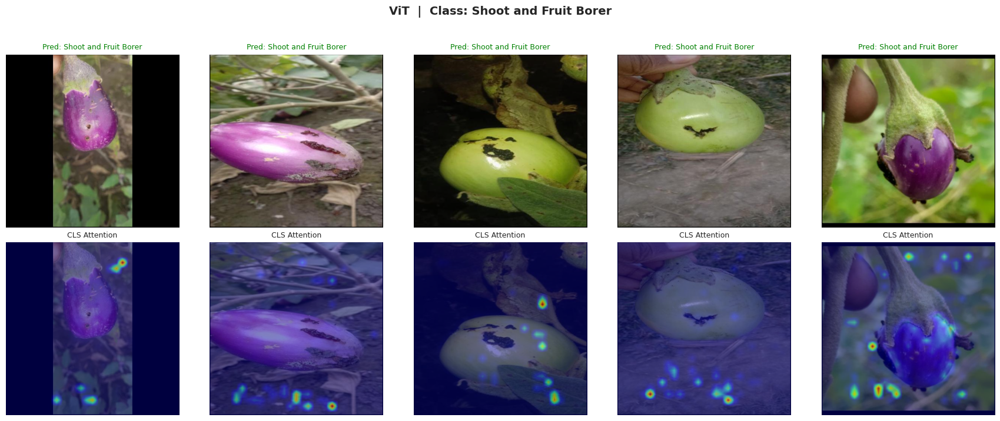

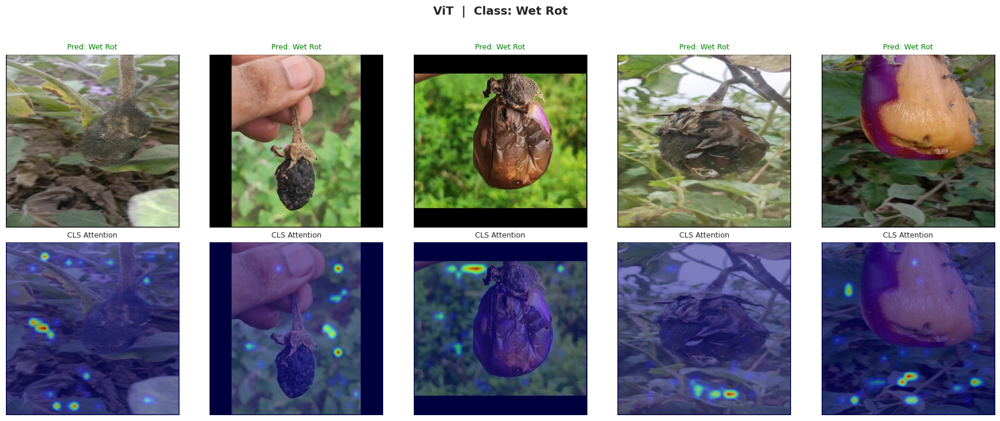

✓ Attention visualisation complete.


In [13]:
def visualize_attention_per_class(model, model_name: str, dataloader,
                                  class_names: list, samples_per_class: int = 5,
                                  patch_start_idx: int = 1):
    """
    For each class, show `samples_per_class` images with their CLS-token attention map.

    patch_start_idx controls which token index patches begin at:
      - ViT  : 1  (token order: CLS, patch_0, patch_1, ...)
      - DeiT : 2  (token order: CLS, DistToken, patch_0, patch_1, ...)
    Using the wrong index for DeiT includes the distillation token in the grid,
    corrupting the spatial map — that's the bug this parameter fixes.
    """
    ckpt = f"{Config.CHECKPOINT_DIR}/{model_name}_best.pth"
    if not os.path.exists(ckpt):
        print(f"❌ Checkpoint not found: {ckpt}")
        if os.path.exists(Config.CHECKPOINT_DIR):
            print(f"   Files in {Config.CHECKPOINT_DIR}:")
            for f in os.listdir(Config.CHECKPOINT_DIR):
                print(f"     {f}")
        return

    model.load_state_dict(torch.load(ckpt, map_location=Config.DEVICE))
    model.eval()
    model = model.to(Config.DEVICE)

    # ── Collect samples ───────────────────────────────────────
    samples_by_class = {i: [] for i in range(len(class_names))}
    done = 0
    print(f"Collecting {samples_per_class} samples per class...")
    for inputs, labels in dataloader:
        for i in range(len(labels)):
            li = labels[i].item()
            if len(samples_by_class[li]) < samples_per_class:
                samples_by_class[li].append(inputs[i])
                if len(samples_by_class[li]) == samples_per_class:
                    done += 1
        if done == len(class_names):
            break

    inv_norm = transforms.Normalize(
        mean=[-0.485/0.229, -0.456/0.224, -0.406/0.225],
        std=[1/0.229, 1/0.224, 1/0.225]
    )

    # ── QKV hook — more robust than attn_drop for visualisation ──
    qkv_buf = []
    def hook_fn(m, inp, out):
        qkv_buf.append(out.detach())
    handle   = model.blocks[-1].attn.qkv.register_forward_hook(hook_fn)
    n_heads  = model.blocks[-1].attn.num_heads
    head_dim = model.blocks[-1].attn.head_dim

    # ── Generate per-class plots ──────────────────────────────
    for cls_idx, img_list in samples_by_class.items():
        if not img_list:
            print(f"  Skipping {class_names[cls_idx]} — no samples found.")
            continue

        batch = torch.stack(img_list).to(Config.DEVICE)
        qkv_buf.clear()
        with torch.no_grad():
            out   = model(batch)
            preds = out.argmax(1)

        # Reconstruct attention from the raw QKV projection output
        qkv     = qkv_buf[0]                                    # (B, N, 3*D)
        B, N, _ = qkv.shape
        qkv     = qkv.reshape(B, N, 3, n_heads, head_dim).permute(2, 0, 3, 1, 4)
        q, k    = qkv[0], qkv[1]                                # (B, heads, N, head_dim)
        attn    = (q @ k.transpose(-2, -1) * (head_dim ** -0.5)).softmax(-1)

        # CLS token (row 0) attending to spatial patches only
        # patch_start_idx: 1 for ViT, 2 for DeiT (skips distillation token)
        cls_a = attn[:, :, 0, patch_start_idx:].mean(dim=1)     # (B, N_patches)
        n_patch = cls_a.shape[-1]
        grid    = int(math.sqrt(n_patch))

        fig, axes = plt.subplots(2, samples_per_class,
                                 figsize=(3.5 * samples_per_class, 7))
        fig.suptitle(
            f"{model_name}  |  Class: {class_names[cls_idx]}",
            fontsize=14, fontweight='bold', y=1.02)

        for i in range(samples_per_class):
            img_np = np.clip(
                inv_norm(batch[i].cpu()).permute(1, 2, 0).numpy(), 0, 1)
            mask = cls_a[i].reshape(grid, grid).cpu().numpy()
            mask = cv2.resize(mask, (img_np.shape[1], img_np.shape[0]))
            mask = (mask - mask.min()) / (mask.max() - mask.min() + 1e-8)

            pred_correct = preds[i].item() == cls_idx
            title_color  = 'green' if pred_correct else 'red'

            axes[0, i].imshow(img_np)
            axes[0, i].set_title(
                f"Pred: {class_names[preds[i].item()]}", color=title_color, fontsize=9)
            axes[0, i].axis('off')

            axes[1, i].imshow(img_np)
            axes[1, i].imshow(mask, cmap='jet', alpha=0.5)
            axes[1, i].set_title("CLS Attention", fontsize=9)
            axes[1, i].axis('off')

        plt.tight_layout()
        plt.show()

    handle.remove()
    print("✓ Attention visualisation complete.")


# ── Run ───────────────────────────────────────────────────────
visualize_attention_per_class(
    vit_model, model_name, test_loader,
    class_names=classes,
    samples_per_class=5,
    patch_start_idx=1    # ViT: no distillation token — patches begin at index 1
)